<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Notes" data-toc-modified-id="Notes-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Notes</a></span></li><li><span><a href="#Libraries" data-toc-modified-id="Libraries-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Libraries</a></span></li><li><span><a href="#Initializing-data" data-toc-modified-id="Initializing-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Initializing data</a></span><ul class="toc-item"><li><span><a href="#Using-polyfit-to-fit-data" data-toc-modified-id="Using-polyfit-to-fit-data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Using polyfit to fit data</a></span></li></ul></li><li><span><a href="#emcee" data-toc-modified-id="emcee-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>emcee</a></span><ul class="toc-item"><li><span><a href="#Log-prior" data-toc-modified-id="Log-prior-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Log prior</a></span></li><li><span><a href="#Log-likelihood" data-toc-modified-id="Log-likelihood-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Log likelihood</a></span></li><li><span><a href="#Log-probability" data-toc-modified-id="Log-probability-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Log probability</a></span></li><li><span><a href="#emcee-sampler" data-toc-modified-id="emcee-sampler-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>emcee sampler</a></span><ul class="toc-item"><li><span><a href="#Time-series" data-toc-modified-id="Time-series-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span>Time series</a></span></li></ul></li></ul></li><li><span><a href="#Final-numbers" data-toc-modified-id="Final-numbers-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Final numbers</a></span></li><li><span><a href="#Testing-blocks" data-toc-modified-id="Testing-blocks-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Testing blocks</a></span></li><li><span><a href="#References" data-toc-modified-id="References-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>References</a></span></li></ul></div>

# Parameter estimation with emcee 

## Notes

To do: 
- plot parameter values as a function of the number of samples used 

## Libraries

In [1]:
import numpy as np

import os.path
import sys 
print("Python %s.%s.%s"%sys.version_info[:3])

import emcee
print("emcee version", emcee.__version__)

from IPython.display import display, HTML

%config InlineBackend.figure_format ='retina'
print(os.getcwd() + "\n")
from matplotlib import pyplot as plt
import corner
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from jupyterthemes import jtplot
jtplot.style(theme='monokai')
jtplot.style(ticks = True, grid = False, figsize = (10,8))

import scipy.stats
from scipy.optimize import minimize
from scipy.optimize import basinhopping

Python 3.6.4
emcee version 3.0rc2
/Users/Isabel/Documents/emcee



## Initializing data 

Data created from the following function, 

\begin{equation*}
y = \textrm{a}  \textrm{x}^7 + \textrm{b}  \textrm{x}^6 ... + \textrm{g x} + \textrm{h}
\end{equation*}

The given dataset contains data for $x$, $y$, and $\sigma_y$ (the standard error in y). Guesses for the eight parameters are obtained using a built-in polynomial fit. 

In [2]:
#import data
data = np.loadtxt( '/Users/Isabel/Documents/emcee/fake3.dat' )
print(data)

[[-4.65682077 -0.81486547  0.12344454]
 [-4.29991906 -0.36492423  0.07819792]
 [-4.29184724 -0.28447198  0.07733909]
 [-3.72085614  0.32090635  0.07229803]
 [-3.61264219  0.30678359  0.08004085]
 [-3.53130727  0.27171581  0.08564348]
 [-3.18338027  0.64116552  0.10797345]
 [-2.97305147  0.59797808  0.12041404]
 [-2.88856258  0.6997287   0.12520076]
 [-2.81833183  0.73218123  0.12908445]
 [-2.45199241  1.02102486  0.14776928]
 [-2.27300196  1.11010842  0.15576702]
 [-1.0519022   1.55311093  0.18047251]
 [-1.02879493  1.38743558  0.18032942]
 [-1.0016557   1.18832023  0.18012985]
 [-0.73288469  1.37376403  0.17631846]
 [-0.67199029  1.45670582  0.17499593]
 [-0.60528268  1.12294502  0.17335612]
 [-0.50371043  1.05838939  0.17048208]
 [-0.47044378  1.47897596  0.16944353]
 [-0.35098849  1.03586882  0.16532939]
 [-0.3391154   1.34358767  0.16488824]
 [ 0.14700538  0.84694616  0.14230317]
 [ 0.39083339  0.95205542  0.12817935]
 [ 0.56877302  0.69335419  0.11701462]
 [ 0.7919807   0.4834532 

### Using polyfit to fit data

Data visualization

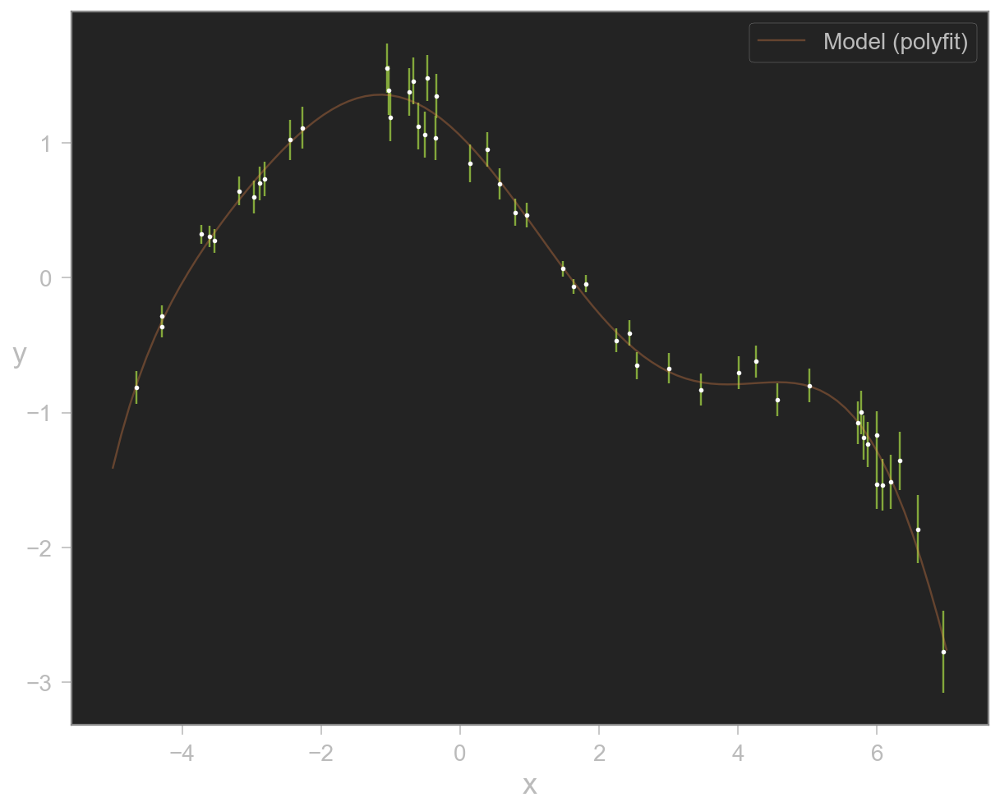

In [3]:
var1 = data[0:,0]
var2 = data[0:,1]
var3 = data[0:,2]
 

x = np.copy(var1)
y = np.copy(var2)
yerr = np.copy(var3)

p7 = np.polyfit(x,y,7)

f = np.poly1d(p7)

xnew = np.linspace(-5,7,100)
ynew = f(xnew)

plt.figure(figsize=(10,8))
plt.errorbar(x,y,yerr=yerr, fmt=".w", ecolor='g')
plt.plot(xnew, ynew, 'y',alpha = 0.3, label ="Model (polyfit)")
plt.legend(fontsize = 14)
plt.xlabel("x", fontsize= 18)
plt.ylabel("y", fontsize= 18, rotation =0)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)
plt.show()

## emcee

Functions for determining log priors, likelihood, and probability to determine ML estimates for emcee to use.

### Log prior 

Stuff about this here.

In [4]:
def log_prior(theta): 
    a, b, c, d, e, f, g, h = theta
    if (-5.0 < a < 5.0 and -5.0 < b < 5.0 and -5.0 < c < 5.0 and -5.0 < d < 5.0 and
        -5.0 < e < 5.0 and -5.0 < f < 5.0 and -5.0 < g < 5.0 and -5.0 < h < 5.0):
        return 0.0
    return -np.inf

### Log likelihood 

Stuff about this here.

In [5]:
def log_likelihood(theta, x, y, yerr): 
    a, b, c, d, e, f, g, h = theta
    model = (a * x ** 7 + b * x ** 6 + c * x ** 5 + d * x ** 4 + e * x ** 3 + f * x **2 + g * x + h)
    return -0.5 * np.sum(((y-model)**2/yerr**2))

### Log probability 

Stuff about this here.

In [6]:
def log_probability(theta, x, y, yerr):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, x, y, yerr)

In [7]:
x = np.copy(var1)
y = np.copy(var2)
yerr = np.copy(var3)
initial = np.array([p7[i] for i in range(8)]) + 0.1* np.random.randn(8)
initial = np.asarray(initial)

n11 = lambda *args: -log_likelihood(*args)
minimizer_kwargs = dict(method="Nelder-Mead", args = (x, y, yerr))
soln = basinhopping(n11, initial, T=1.0, stepsize =0.01, niter = 200, 
                    minimizer_kwargs=minimizer_kwargs)
print(soln)

a_ml, b_ml, c_ml, d_ml, e_ml, f_ml, g_ml, h_ml = soln.x

                        fun: 17.478575609875588
 lowest_optimization_result:  final_simplex: (array([[  1.77259414e-05,  -1.95609489e-04,  -8.61452442e-04,
          8.19979975e-03,   3.17591894e-02,  -1.70324210e-01,
         -4.62431393e-01,   1.01236468e+00],
       [  1.77317564e-05,  -1.95627044e-04,  -8.61702131e-04,
          8.20087236e-03,   3.17581992e-02,  -1.70337612e-01,
         -4.62380846e-01,   1.01234360e+00],
       [  1.77192947e-05,  -1.95561048e-04,  -8.61386110e-04,
          8.19947962e-03,   3.17594342e-02,  -1.70345518e-01,
         -4.62433666e-01,   1.01245025e+00],
       [  1.77297101e-05,  -1.95634195e-04,  -8.61490427e-04,
          8.20018987e-03,   3.17590903e-02,  -1.70326178e-01,
         -4.62439052e-01,   1.01231755e+00],
       [  1.77244574e-05,  -1.95601700e-04,  -8.61360850e-04,
          8.19956138e-03,   3.17587925e-02,  -1.70333083e-01,
         -4.62462167e-01,   1.01239762e+00],
       [  1.77338849e-05,  -1.95650251e-04,  -8.61719626e-04,

### emcee sampler 

Preparing to sample the above distribution using emcee. We start by initializing our walkers in a tiny Gaussian ball around the ML result, then run MCMC for a set number of steps. 

In [8]:
pos = soln.x + 1e-4 * np.random.randn(200,8)
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
num_steps = [10, 500, 700, 1000, 1500, 3000, 4000, 5000]

#### Time series 

A look at the time series of the parameters in the chain. The plot below shows the positions of the walkers as a function of number of steps in the chain (which ranges from 500 to 5000). 

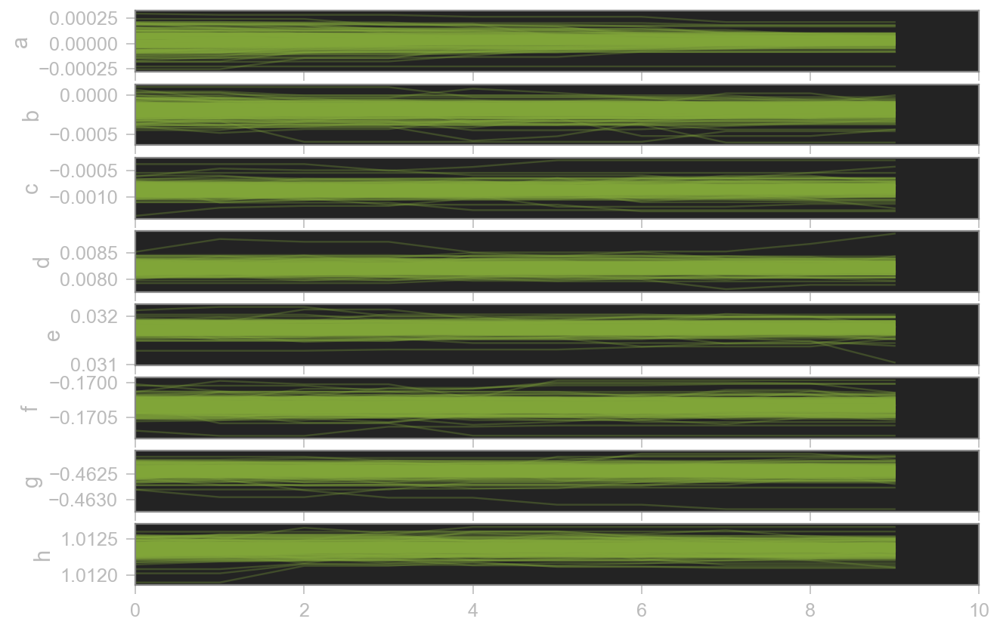

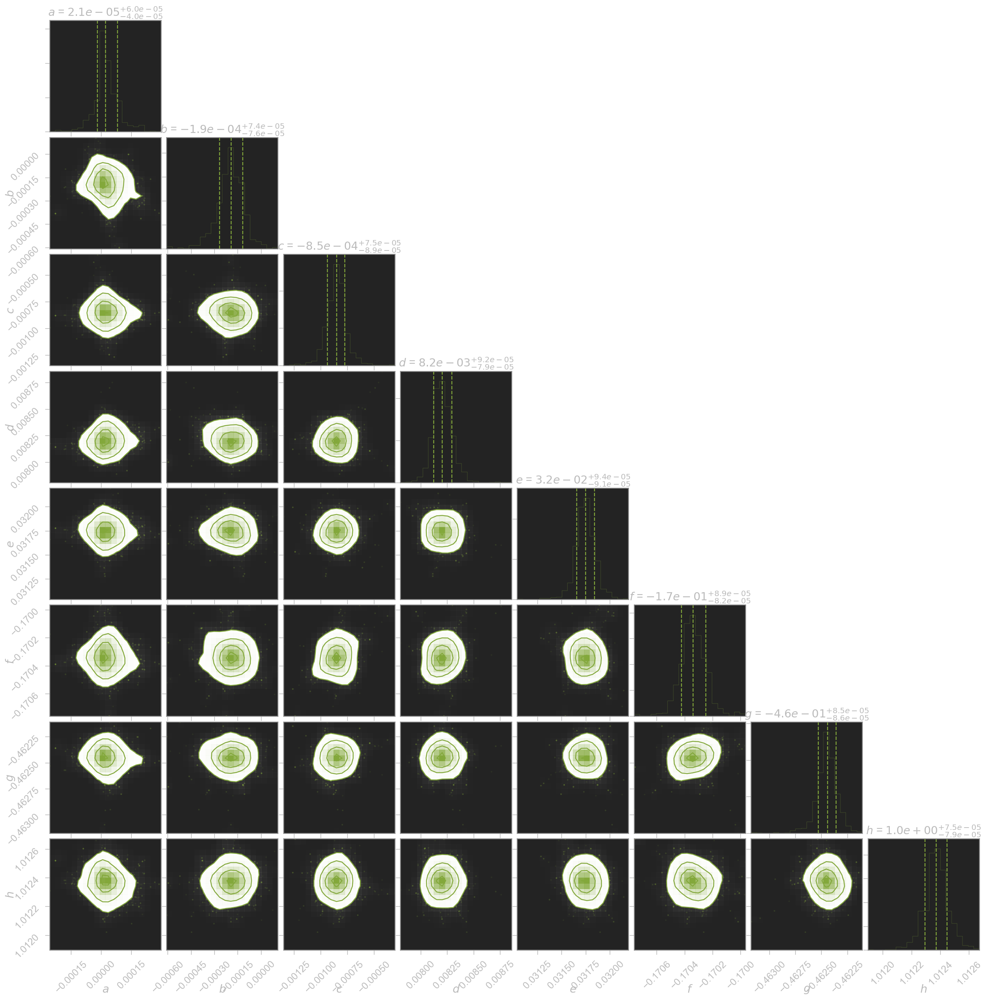

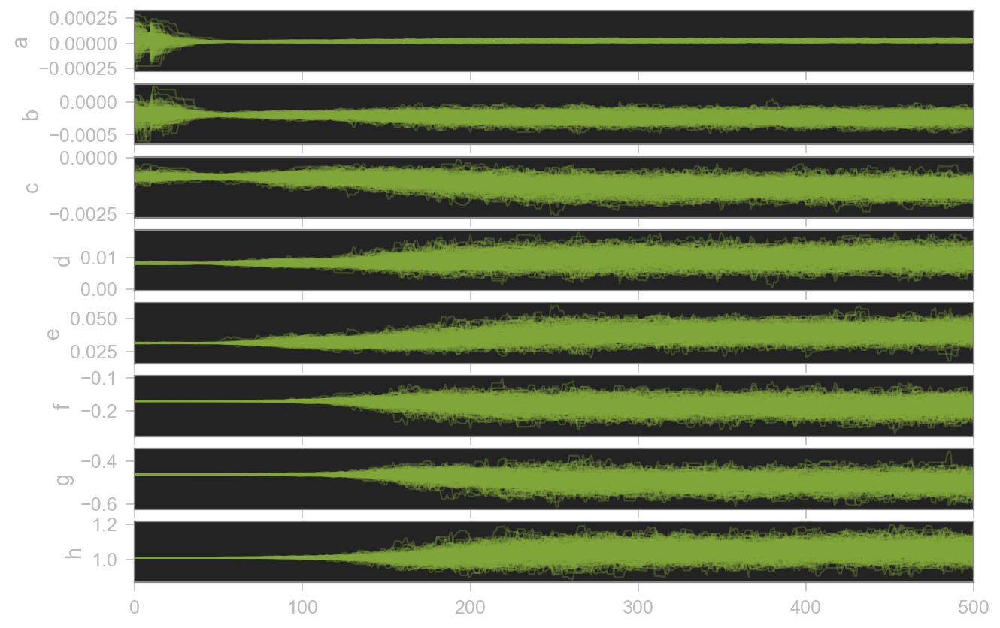

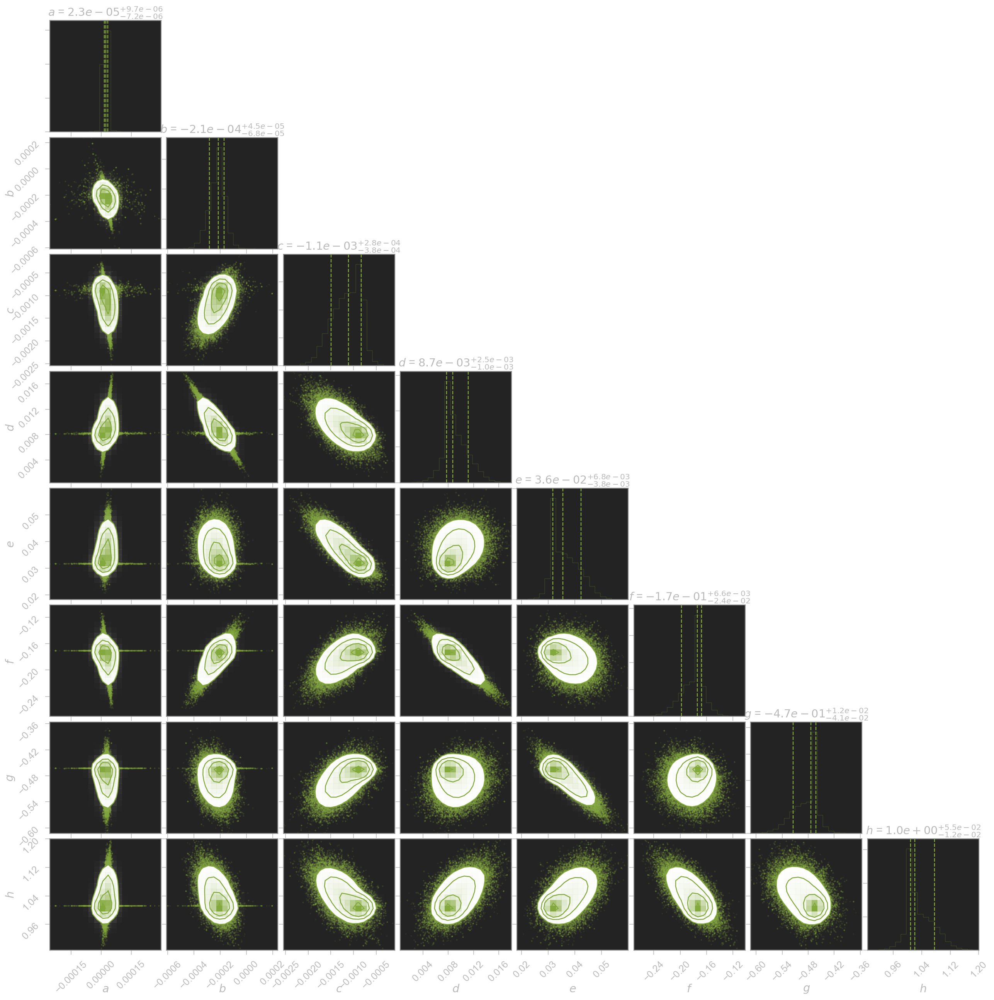

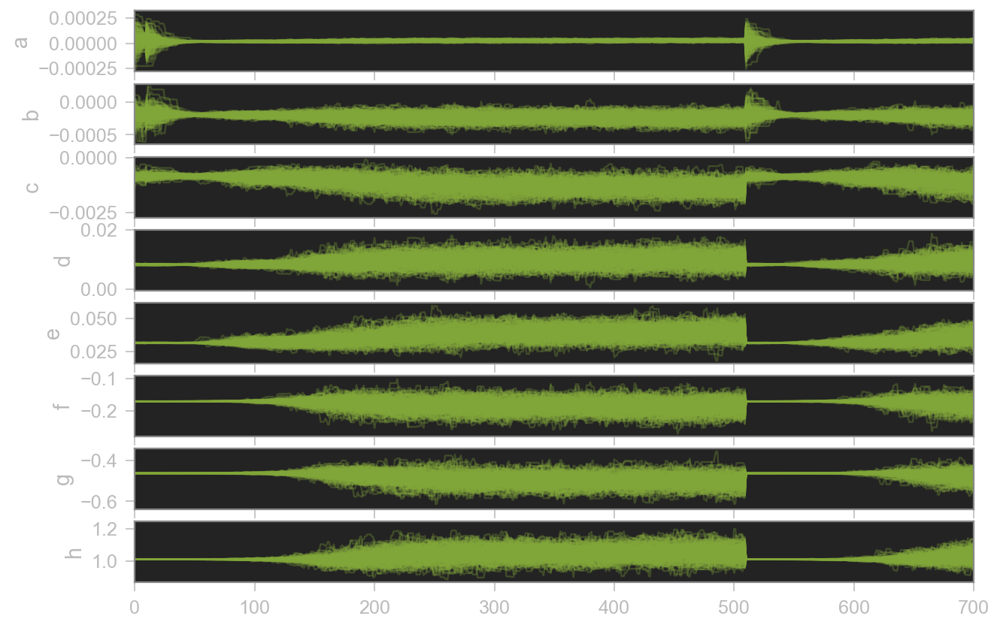

...

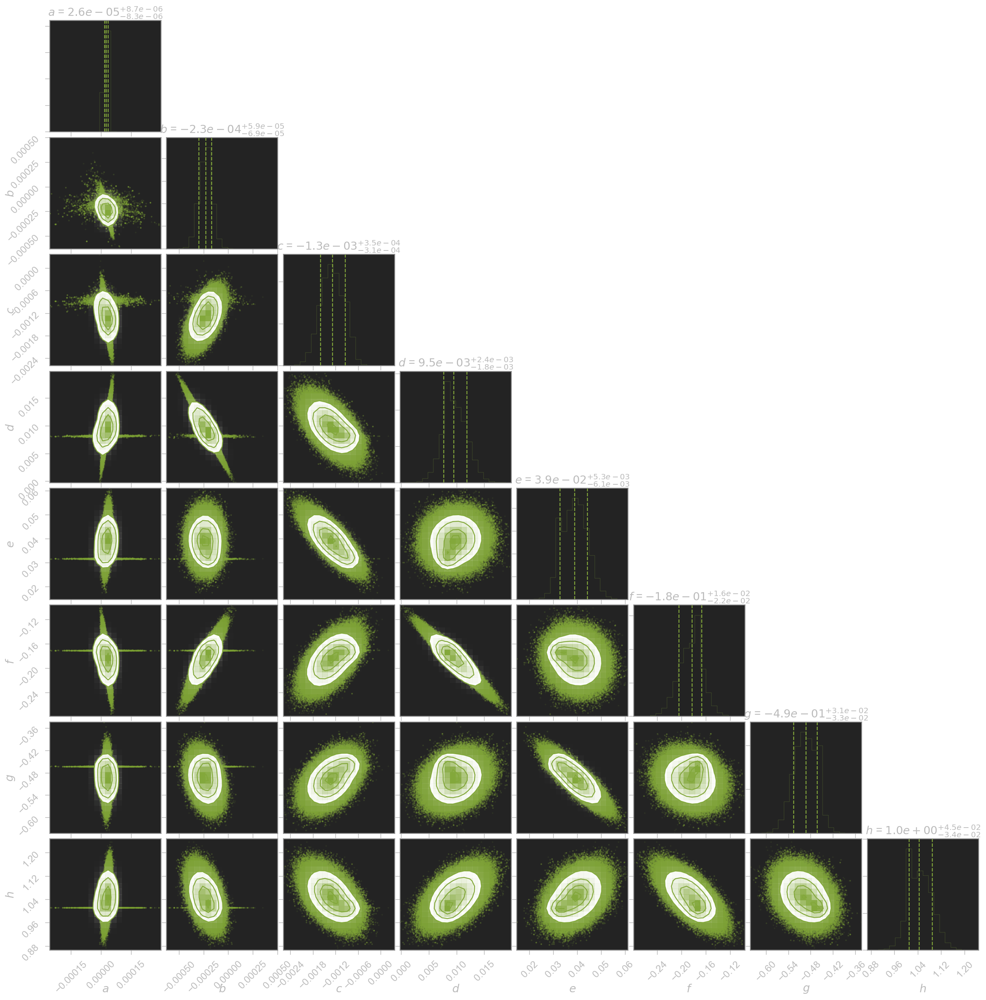

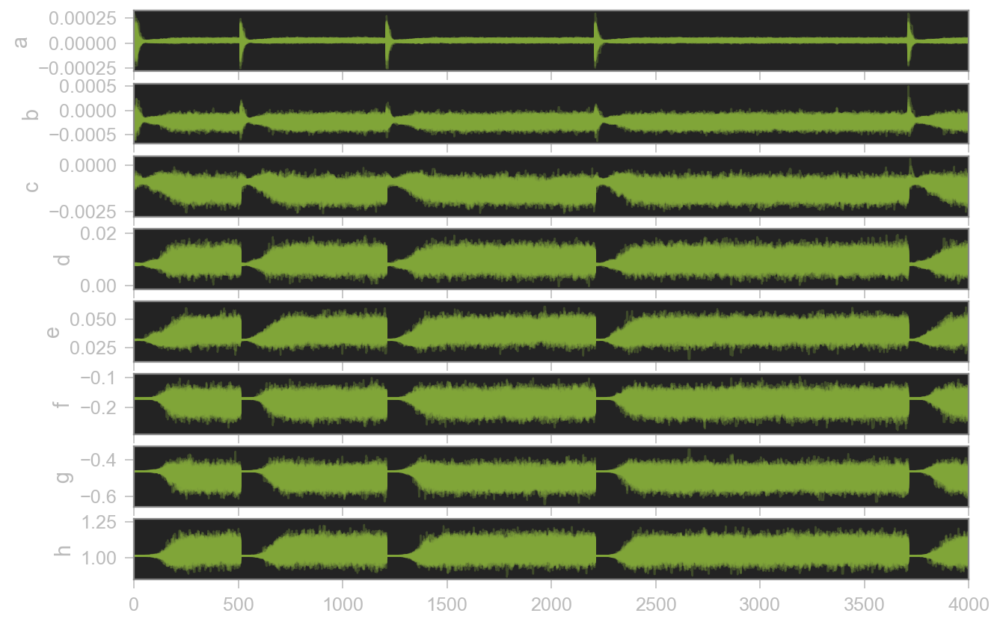

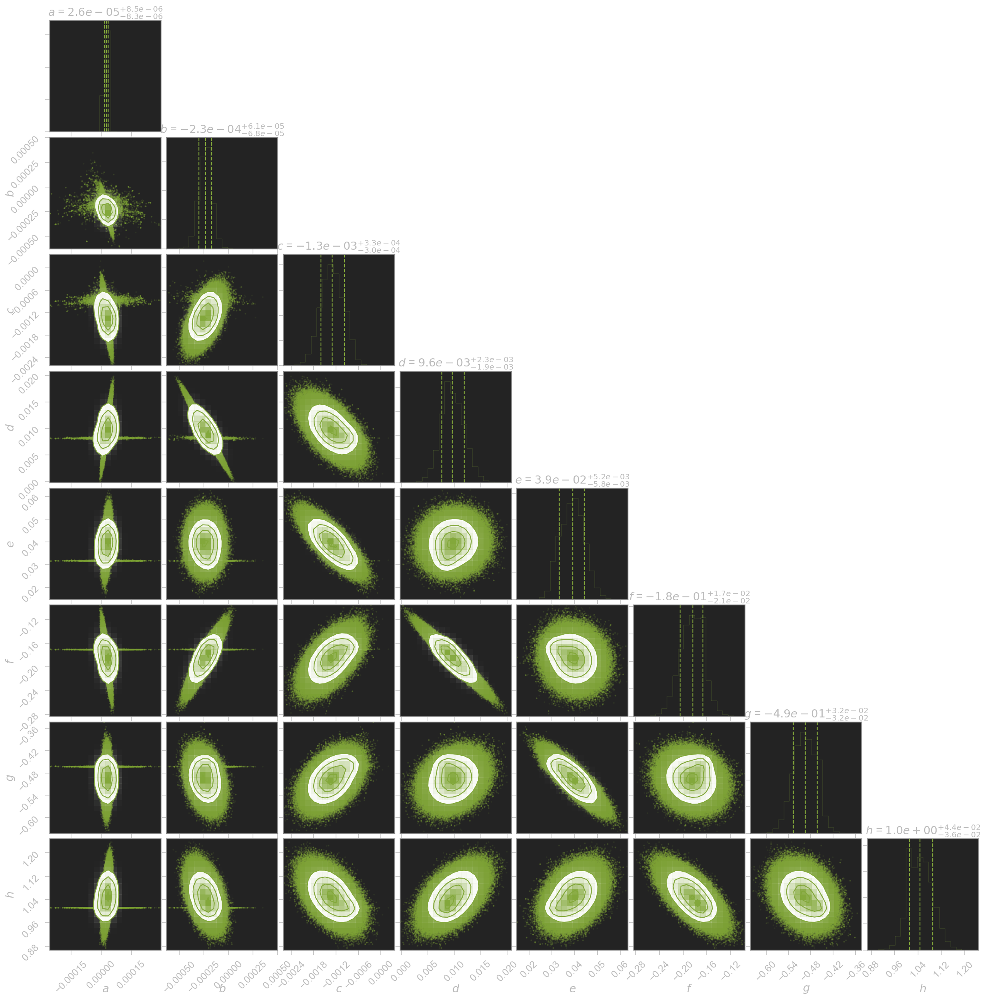

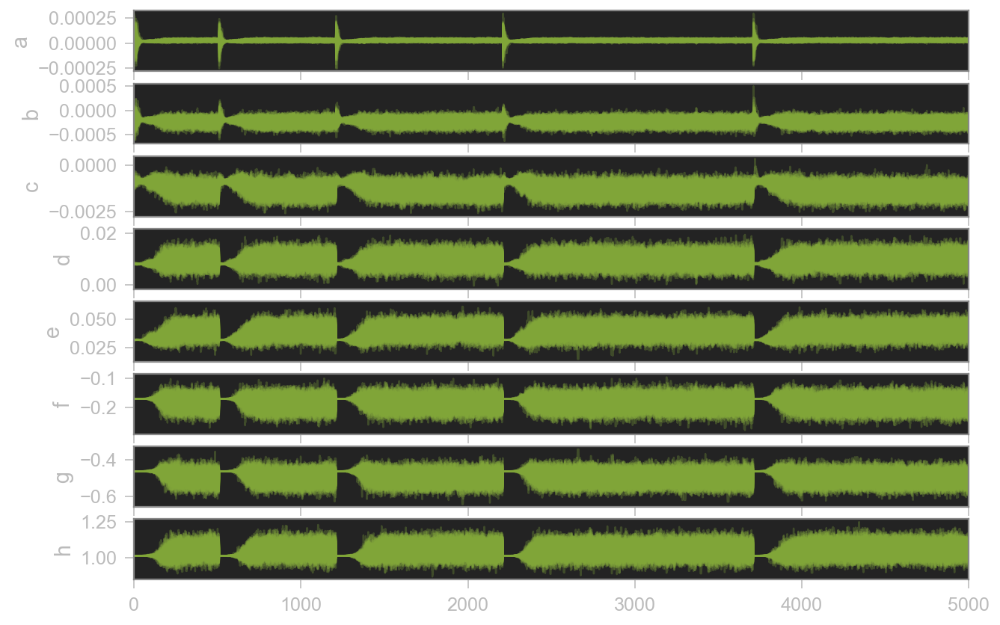

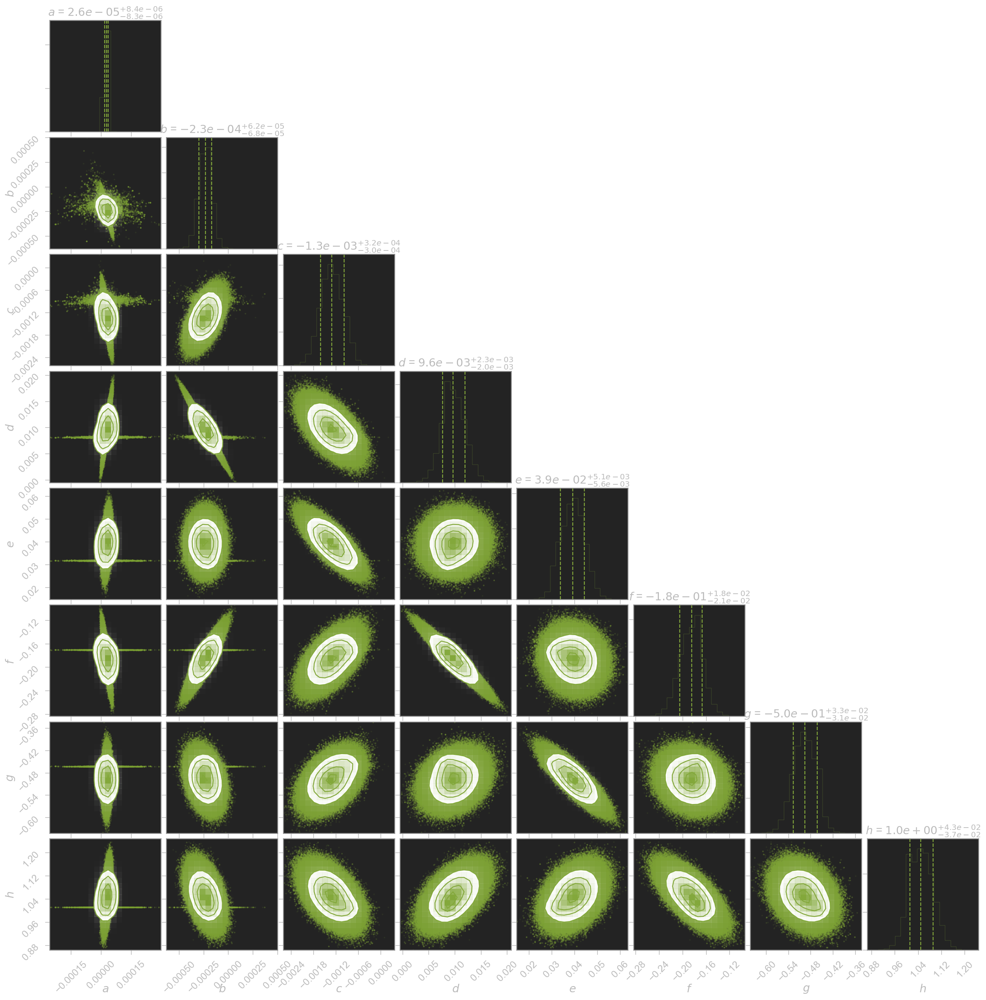

In [9]:
for i in num_steps: 
    sampler.run_mcmc(pos, i)
    samples = sampler.get_chain()

    #samples = sampler.chain[:, :, :].reshape((-1,ndim))   
    #samples = sampler.chain[:, :, :]
    #print(samples.shape)
    
    labels = ["a", "b", "c", "d","e","f","g", "h"]
    fig, axes = plt.subplots(8, figsize=(10, 7), sharex=True)
    samples_corner = sampler.chain[:, :, :].reshape((-1,ndim)) 
    fig = corner.corner(samples_corner, labels=["$a$", "$b$", "$c$", "$d$", "$e$", "$f$","$g$","$h$"], 
                        quantiles=[0.16, 0.5, 0.84], color = 'g',histtype='bar',show_titles=True, 
                        title_fmt='.1e', smooth = True, fill_contours=False, figsize=(10,10))

    for j in range(ndim):
        ax = axes[j]
        ax.plot(samples[:, :, j], "g", alpha=0.3)
        ax.set_xlim(0, i)
        ax.set_ylabel(labels[j])
    
    

In [10]:
#for i in num_samples: 
#    for j in range(len(p7)):
#        sampler.run_mcmc(pos, i)
#        samples = sampler.chain[:, :, :].reshape((-1,ndim))
#        a_mc, b_mc, c_mc, d_mc, e_mc,  f_mc, g_mc, h_mc = \
#        list(map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]), zip(*np.percentile(samples, [16, 50, 84], axis=0))))
#        a_mcmc.append(a_mc[0])
#        b_mcmc.append(b_mc[0])
#        c_mcmc.append(c_mc[0])
#        d_mcmc.append(d_mc[0])
#        e_mcmc.append(e_mc[0])
#        f_mcmc.append(f_mc[0])
#        g_mcmc.append(g_mc[0])
#        h_mcmc.append(h_mc[0])

    
    #fig = corner.corner(samples, labels=["$a$", "$b$", "$c$", "$d$", "$e$", "$f$","$g$","$h$"], 
    #                    quantiles=[0.16, 0.5, 0.84], color = 'g',histtype='bar',show_titles=True, 
    #                     title_fmt='.1e', smooth = True, fill_contours=False, figsize=(10,10))
# fig = make_subplots(rows=4, cols=2, shared_yaxes=True, shared_xaxes = True)

# fig.add_trace(
#     go.Scatter(x=num_samples, y=a_mcmc, name = 'a'),
#     row=1, col=1
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=b_mcmc, name = 'b'),
#     row=2, col=1
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=c_mcmc, name = 'c'),
#     row=3, col=1
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=d_mcmc, name = 'd'),
#     row=4, col=1
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=e_mcmc, name = 'e'),
#     row=1, col=2
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=f_mcmc, name = 'f'),
#     row=2, col=2
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=g_mcmc, name = 'g'),
#     row=3, col=2
# )
# fig.add_trace(
#     go.Scatter(x=num_samples, y=h_mcmc, name = 'h'),
#     row=4, col=2
# )
# fig.update_xaxes(title_text="Number of samples", row=4, col=1)
# fig.update_xaxes(title_text="Number of samples", row=4, col=2)
# fig.update_layout(height=600, width=800, title_text="Parameter value vs number of samples", yaxis_exponentformat = 'power',  template="plotly_dark")

# fig.show()

In [11]:
# samples = sampler.chain[:, :, :].reshape((-1,ndim))

# import corner

# fig = corner.corner(samples, labels=["$a$", "$b$", "$c$", "$d$", "$e$", "$f$","$g$","$h$"], 
#                     quantiles=[0.16, 0.5, 0.84], color = 'g',histtype='bar',show_titles=True, 
#                      title_fmt='.1e', smooth = True, fill_contours=False, figsize=(10,10))
# fig.savefig("triangle.png")

## Final numbers

In [12]:
#mcmc = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]), zip(*np.percentile(samples, [16, 50, 84], axis=0)))
#a_mcmc, b_mcmc, c_mcmc, d_mcmc, e_mcmc,  f_mcmc, g_mcmc, h_mcmc = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]), zip(*np.percentile(samples, [16, 50, 84], axis=0)))

In [13]:
# print("MCMC estimates:")
# print("a = {0:0.3e} ".format(a_mcmc[0]), ",", "+ {0:0.3e}" .format(a_mcmc[1]), ",", "- {0:0.3e}".format(a_mcmc[2])) 
# print("b = {0:0.3e} ".format(b_mcmc[0]), ",", "+ {0:0.3e}" .format(b_mcmc[1]), ",", "- {0:0.3e}".format(b_mcmc[2])) 
# print("c = {0:0.3e} ".format(c_mcmc[0]), ",", "+ {0:0.3e}" .format(c_mcmc[1]), ",", "- {0:0.3e}".format(c_mcmc[2])) 
# print("d = {0:0.3e} ".format(d_mcmc[0]), ",", "+ {0:0.3e}" .format(d_mcmc[1]), ",", "- {0:0.3e}".format(d_mcmc[2])) 
# print("e = {0:0.3e} ".format(e_mcmc[0]), ",", "+ {0:0.3e}" .format(e_mcmc[1]), ",", "- {0:0.3e}".format(e_mcmc[2])) 
# print("f = {0:0.3e} ".format(f_mcmc[0]), ",", "+ {0:0.3e}" .format(f_mcmc[1]), ",", "- {0:0.3e}".format(f_mcmc[2])) 
# print("g = {0:0.3e} ".format(g_mcmc[0]), ",", "+ {0:0.3e}" .format(g_mcmc[1]), ",", "- {0:0.3e}".format(g_mcmc[2])) 
# print("h = {0:0.3e} ".format(h_mcmc[0]), ",", "+ {0:0.3e}" .format(h_mcmc[1]), ",", "- {0:0.3e}".format(h_mcmc[2])) 

# print("---------------------")
# print("Initial guesses:")
print("a = {0:0.3e}".format(p7[0]))
# print("b = {0:0.3e}".format(p7[1]))
# print("c = {0:0.3e}".format(p7[2])) 
# print("d = {0:0.3e}".format(p7[3])) 
# print("e = {0:0.3e}".format(p7[4])) 
# print("f = {0:0.3e}".format(p7[5])) 
# print("g = {0:0.3e}".format(p7[6])) 
# print("h = {0:0.3e}".format(p7[7])) 

# print("---------------------")
# print("Maximum likelihood estimates:")
# print("a = {0:0.3e}".format(a_ml))
# print("b = {0:0.3e}".format(b_ml))
# print("c = {0:0.3e}".format(c_ml)) 
# print("d = {0:0.3e}".format(d_ml)) 
# print("e = {0:0.3e}".format(e_ml)) 
# print("f = {0:0.3e}".format(f_ml)) 
# print("g = {0:0.3e}".format(g_ml)) 
# print("h = {0:0.3e}".format(h_ml)) 

#print("g = {0:0.3e}".format(d_ml)) 
#print("h = {0:0.3e}".format(d_ml)) 


a = 2.126e-05


## Testing blocks

In [14]:
#num_samples = [10, 20, 30]#, 50, 100, 150, 200, 250, 500]
#pars = np.ones((len(num_samples), len(p7)))

In [15]:
# for i in num_samples:
#     print('-------')
#     print(i)
#     print('-------')
#     for j in range(len(p7)):
#        # print(j)
#         pars[:,j] = list(mcmc)[0][j]
# pars[0]

In [16]:
import plotly.io as pio
pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'plotly', 'plotly_white', 'plotly_dark',
         'presentation', 'xgridoff', 'none']

In [17]:
#for i in range(len(num_samples)):
#    print("a = {0:0.3e} ".format(a_mcmc[i]))

In [18]:
for i in num_steps:
    #print(i)
    for j in range(9):
        pass
        print(i)

10
10
10
10
10
10
10
10
10
500
500
500
500
500
500
500
500
500
700
700
700
700
700
700
700
700
700
1000
1000
1000
1000
1000
1000
1000
1000
1000
1500
1500
1500
1500
1500
1500
1500
1500
1500
3000
3000
3000
3000
3000
3000
3000
3000
3000
4000
4000
4000
4000
4000
4000
4000
4000
4000
5000
5000
5000
5000
5000
5000
5000
5000
5000


## References

Link to emcee v3 documentation: https://emcee.readthedocs.io/en/latest/tutorials/line/